In [1]:
import numpy as np
from pylab import *

In [2]:
#Part A 

v_m = 1
p_m = 1

def v(p):
    return v_m*(1-p/p_m)

def F(p):
    return p * v(p)

In [3]:
Nx = 500
Nt = 1000
tf = 1

x = np.linspace(0,1,Nx)
t = np.linspace(0, tf, Nt)

h = tf/(Nt-1)
L = 1.0
a = L/(Nx-1)

print(h, h/2/a)

0.001001001001001001 0.24974974974974976


In [4]:
p = np.zeros([Nx,Nt])

#Initial condition
p[:Nx//4, 0] = p_m 

def rho_calc(p):

    for n in range(Nt-1):
        for i in range(Nx-1):

            p[i,n+1] = 0.5*(p[(i+1)%Nx,n]+p[i-1,n]) - (h/2/a)*(F(p[(i+1)%Nx,n])-F(p[i-1,n]))
            
    return p

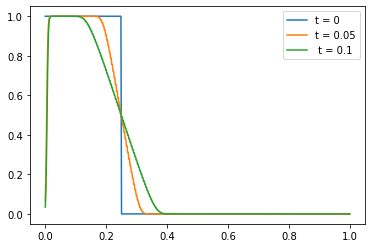

In [5]:
p = rho_calc(p)

plot(x, p[:,0], label = 't = 0')
plot(x, p[:, 50], label = 't = 0.05')
plot(x, p[:, 100], label = ' t = 0.1')
legend()

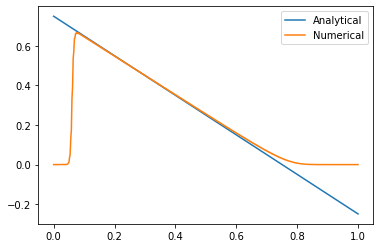

In [6]:
#Part B

def Rho(x,t):
    x0 = 0.25
    return 0.5 * (1 - (x-x0)/(v_m * t))
    
plot(x, Rho(x,t[500]), label = 'Analytical')
plot(x, p[:, 500], label = 'Numerical')
legend()

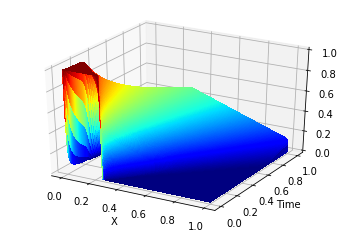

In [15]:
#Part C

t2 = np.linspace(0, tf ,Nt) 
x2 = np.linspace(0, L, Nx)
t2, x2 = np.meshgrid(t2,x2)

# I have used surface3d_demo.py from matplotlib's gallery as template.
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(x2, t2, p, rstride=1, cstride=1, cmap='jet',
                       linewidth=0, antialiased=False)


xlabel("X")
ylabel("Time")
show()

In [8]:
#Part D 

p2 = np.zeros([Nx,Nt])

def gauss(x):
    x0 = L/2
    max_p = 1
    sigma = L/8
    return max_p * np.exp(-(x-x0)**2/(2*(sigma**2)))

#Initial condition
p2[:, 0] = gauss(x)

p2 = rho_calc(p2)


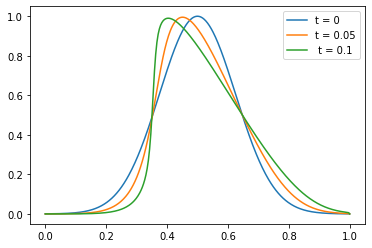

In [9]:
plot(x, p2[:,0], label = 't = 0')
plot(x, p2[:, 50], label = 't = 0.05')
plot(x, p2[:, 100], label = ' t = 0.1')
legend()

In [10]:
#Part E

p3 = np.zeros([Nx,Nt])

def initC(x):
    p_max = 1 
    return p_max/2 * (1+np.cos(np.pi * 4 * x/L))


#Initial condition
p3[:, 0] = initC(x)

p3 = rho_calc(p3)

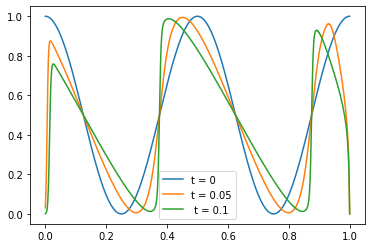

In [11]:
#Part F

plot(x, p3[:,0], label = 't = 0')
plot(x, p3[:, 50], label = 't = 0.05')
plot(x, p3[:, 100], label = ' t = 0.1')
legend()

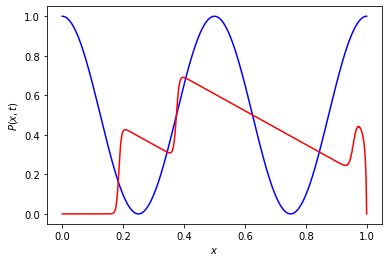

In [12]:
#Extra Credit

import matplotlib.animation as animation

fig1 = figure()
ylabel('$P(x,t)$', fontsize=10)
xlabel('$x$', fontsize=10)

anim = []
for n in range(1,Nt//2):
    anim.append(plt.plot(x, p3[:,0], '-b', x, p3[:,n], '-r', label='{n}'.format(n=n)))
im = animation.ArtistAnimation(fig1, anim, interval=10, repeat_delay=100,blit=True)

#I used the second line since the animation was not working with the first one, might have to switch it to run for you

#rcParams['animation.html'] = 'html5'
# For some, the following line works instead:
plt.rcParams['animation.html'] = 'jshtml'

im